# read and annotate all Nunez et al norm samples

In [1]:
import os
import readfcs
import scanpy as sc
import anndata as ad
import pandas as pd
import cytovi

/home/projects/amit/floriani/mambaforge/envs/cytovi_gpu/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_use_gpu' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [6]:
# read fcs files and add md
data_dir = '../data/raw/Spectral flow/Nunez/For Chiquito/Raw_100000'
files =  os.listdir(data_dir)
fcs_files = [file for file in files if not file.startswith('.')]
fcs_files = [fcs_files[i] for i in [2, 4]]

adata_list = []
sample_num = 0

for fcs_file in fcs_files:
    if fcs_file.endswith('.fcs'):
        fcs_path = os.path.join(data_dir, fcs_file)
        adata = readfcs.read(fcs_path)

        # add md
        adata.obs['filename'] = fcs_file
        adata.obs['sample_id'] = sample_num
        # adata.obs['tube'] = fcs_file.split('_')[2]

        adata.layers['raw'] = adata.X.copy()
    
        sample_num += 1
        adata_list.append(adata)

adata = ad.concat(adata_list, join='outer', label='sample_id')   

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [7]:
# remove non-informative marker
rm_marker = ('-', 'LD', 'Time')
marker_keep = adata.var_names[~adata.var_names.isin(rm_marker)].to_list()
marker_keep
adata = adata[:,marker_keep].copy()

# make obs unique
adata.obs_names_make_unique()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [8]:
# read md and modify
md = pd.read_excel(f'{data_dir}/../Metadata_Flo.xlsx')
md = md[['Tubes', 'Vial Number', 'Round', 'file_name']]
md.rename(columns = {'Round': 'batch', 'Tubes': 'tube', 'file_name': 'filename'}, inplace = True)
md['filename'] = md['filename'].str.split('_clean').str[0]
md = md.loc[md['filename'].isin(fcs_files),:]

In [9]:
# add md
index = adata.obs.index
adata.obs = adata.obs.merge(md, on= 'filename', how = 'left')
adata.obs.index = index

adata.obs['batch'] = adata.obs['batch'].astype('category')


AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer



In [10]:
# split the two batches and save on disk
adata_batch1 = adata[adata.obs['batch'] == 1]
adata_batch2 = adata[adata.obs['batch'] == 2]


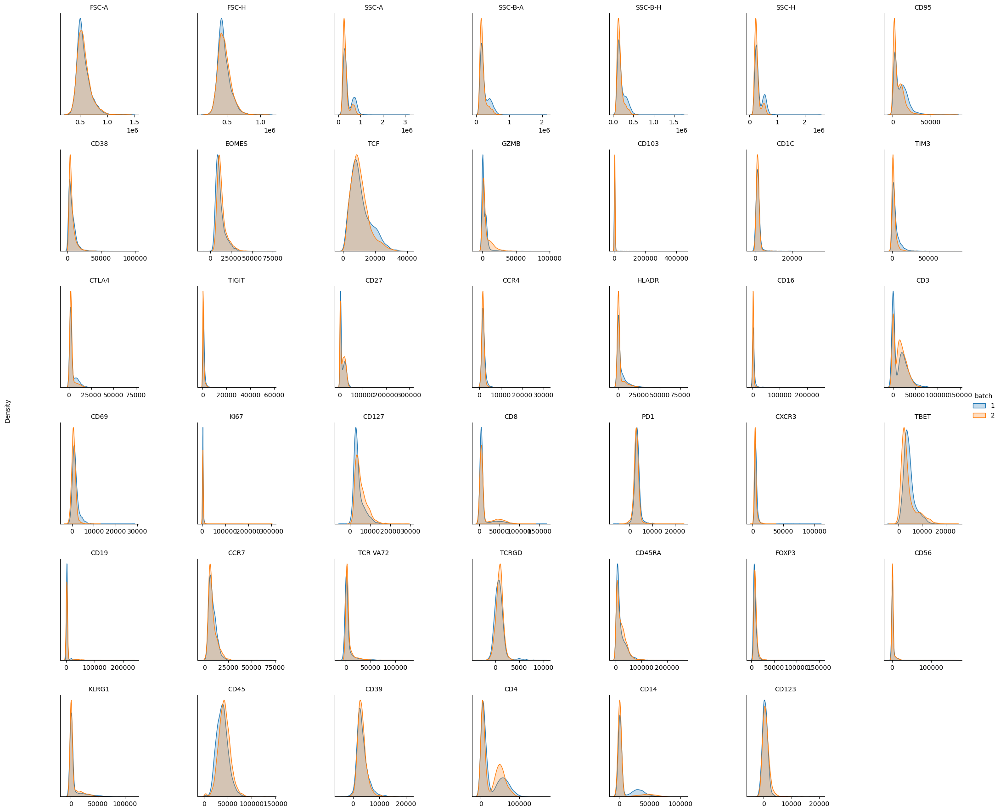

In [11]:
cytovi.pl.histogram(adata, group_by='batch')

# preprocess and anotate batch 1

In [12]:
# preprocess
cytovi.pp.arcsinh(adata_batch1, global_scaling_factor=2000)
cytovi.pp.scale(adata_batch1)

Detected scatter features, which are omited for transformation. 
Scatter features: FSC-A, FSC-H, SSC-A, SSC-B-A, SSC-B-H, SSC-H


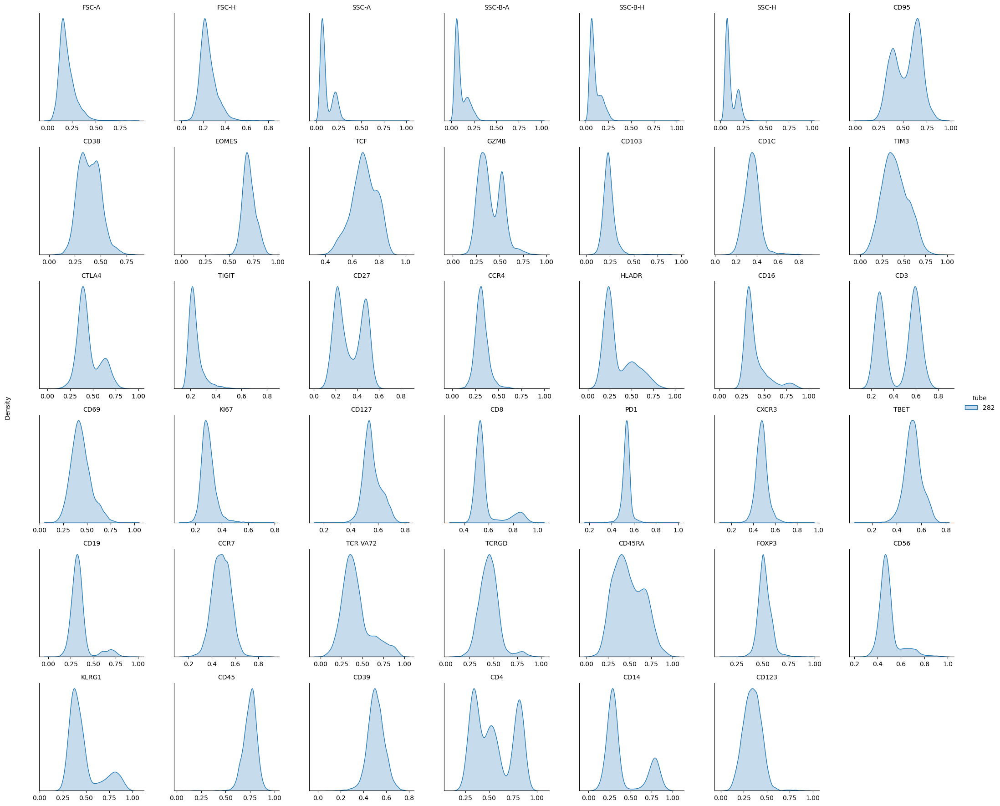

In [13]:
cytovi.pl.histogram(adata_batch1, group_by='tube', layer_key='scaled')

In [14]:
# run clustering
adata_batch1.X = adata_batch1.layers['scaled']
sc.pp.neighbors(adata_batch1)
sc.tl.umap(adata_batch1)

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit fo

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


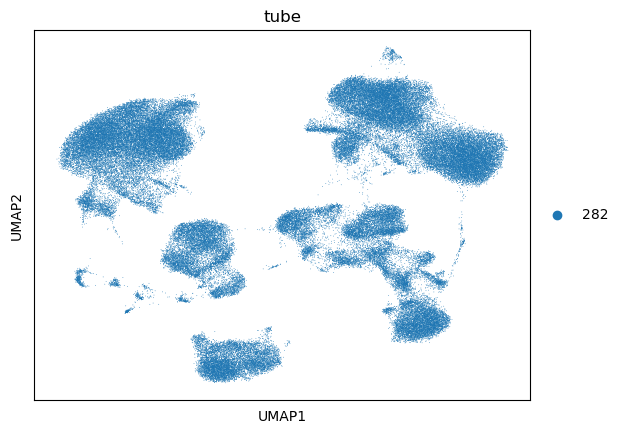

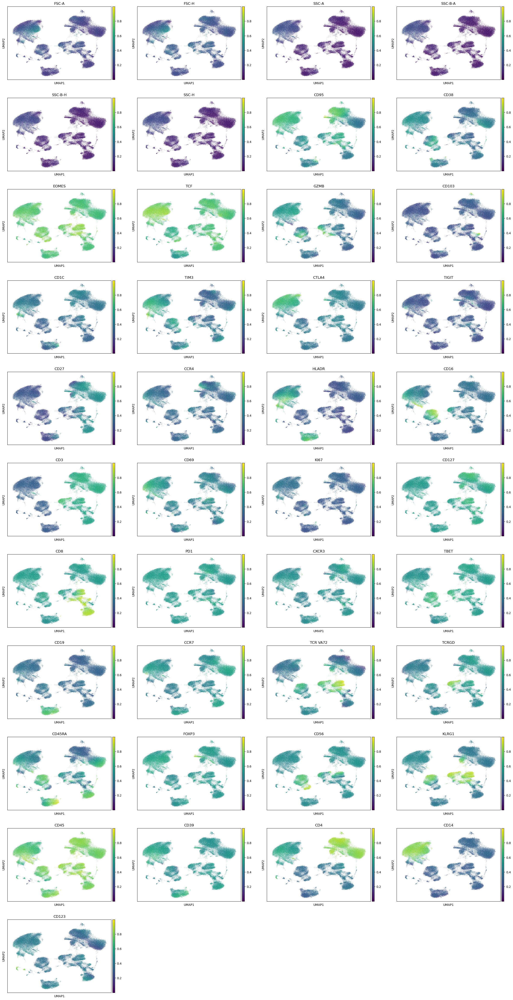

In [15]:
adata_batch1.obs['tube'] = adata_batch1.obs['tube'].astype('category')
sc.pl.umap(adata_batch1, color = 'tube')
sc.pl.umap(adata_batch1, color = adata.var_names, use_raw = False, layer = 'scaled')

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


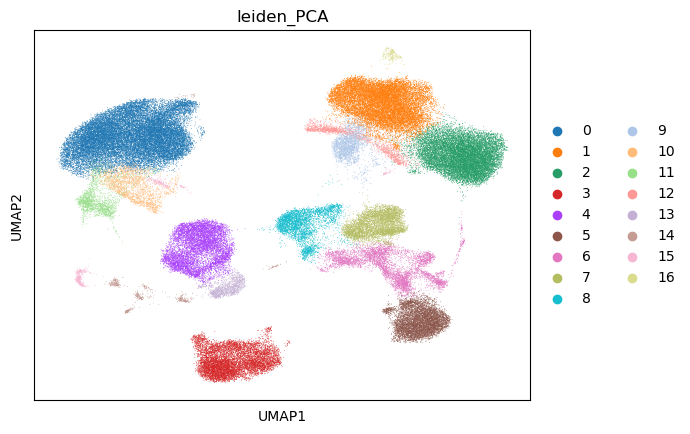

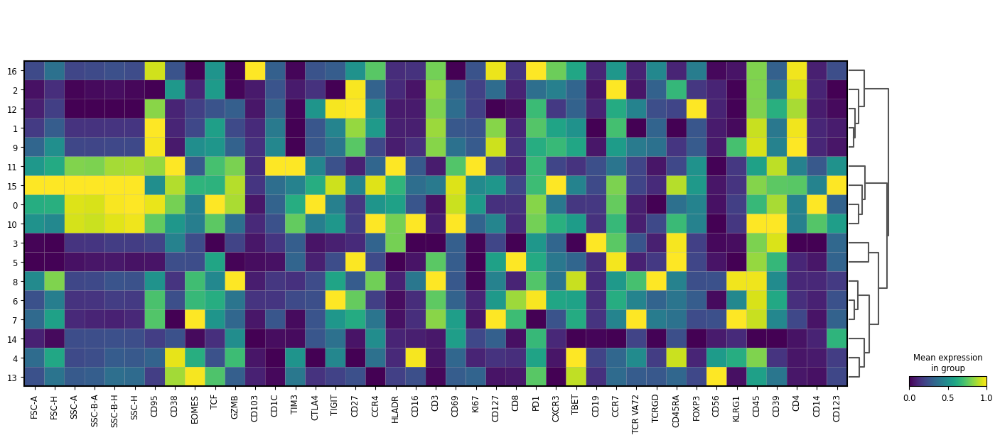

In [18]:
sc.tl.leiden(adata_batch1, key_added="leiden_PCA", resolution = 0.5)
sc.pl.umap(adata_batch1, color = 'leiden_PCA')
sc.pl.matrixplot(adata_batch1, var_names=list(adata_batch1.var_names), dendrogram=True, groupby='leiden_PCA', use_raw = False, layer = 'scaled', standard_scale='var')

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


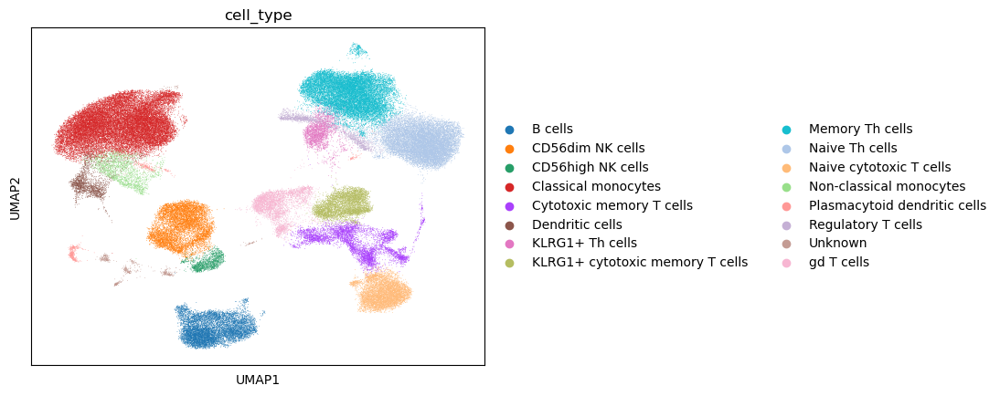

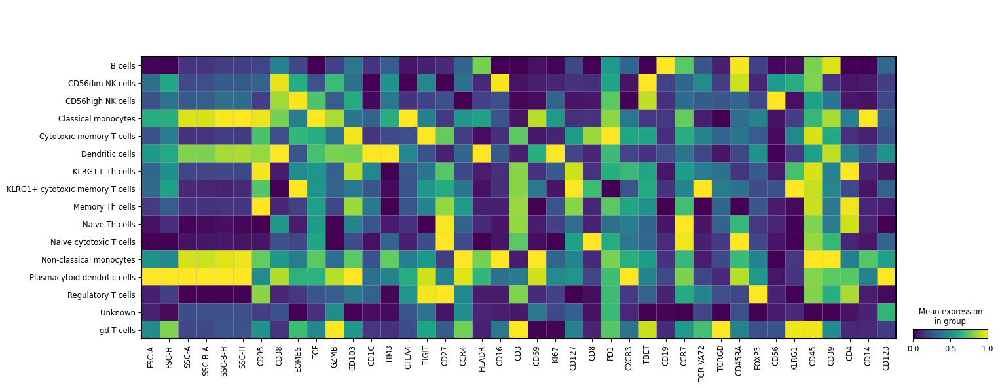

In [25]:
# annotate
ann_dict_1 = {'16': 'Memory Th cells',
            '2': 'Naive Th cells',
            '12': 'Regulatory T cells',
            '1': 'Memory Th cells',
            '9': 'KLRG1+ Th cells',
            '11': 'Dendritic cells',
            '15': 'Plasmacytoid dendritic cells',
            '0': 'Classical monocytes',
            '10': 'Non-classical monocytes',
            '3': 'B cells',
            '5': 'Naive cytotoxic T cells',
            '8': 'gd T cells',
            '6': 'Cytotoxic memory T cells',
            '7': 'KLRG1+ cytotoxic memory T cells',
            '14': 'Unknown',
            '4': 'CD56dim NK cells',
            '13': 'CD56high NK cells'
            }


adata_batch1.obs['cell_type'] = adata_batch1.obs['leiden_PCA'].map (ann_dict_1).astype('category')

sc.pl.umap(adata_batch1, color = 'cell_type')
sc.pl.matrixplot(adata_batch1, var_names=list(adata_batch1.var_names), groupby='cell_type', use_raw = False, layer = 'scaled', standard_scale='var')            

# preprocess and anotate batch 2

In [21]:
# preprocess
cytovi.pp.arcsinh(adata_batch2, global_scaling_factor=2000)
cytovi.pp.scale(adata_batch2)

Detected scatter features, which are omited for transformation. 
Scatter features: FSC-A, FSC-H, SSC-A, SSC-B-A, SSC-B-H, SSC-H


In [22]:
# run umap
adata_batch2.X = adata_batch2.layers['scaled']
sc.pp.neighbors(adata_batch2)
sc.tl.umap(adata_batch2)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


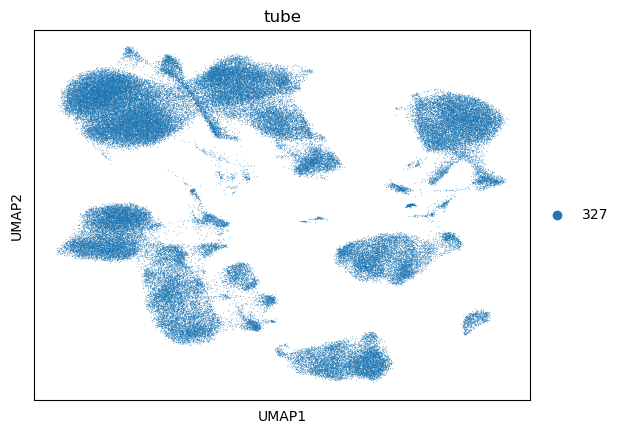

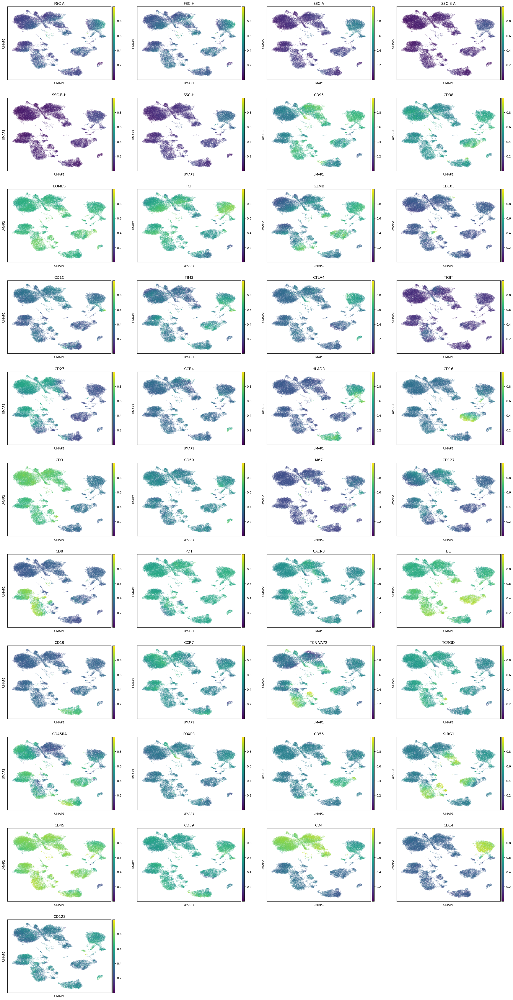

In [23]:
adata_batch2.obs['tube'] = adata_batch2.obs['tube'].astype('category')
sc.pl.umap(adata_batch2, color = 'tube')
sc.pl.umap(adata_batch2, color = adata.var_names, use_raw = False, layer = 'scaled')

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


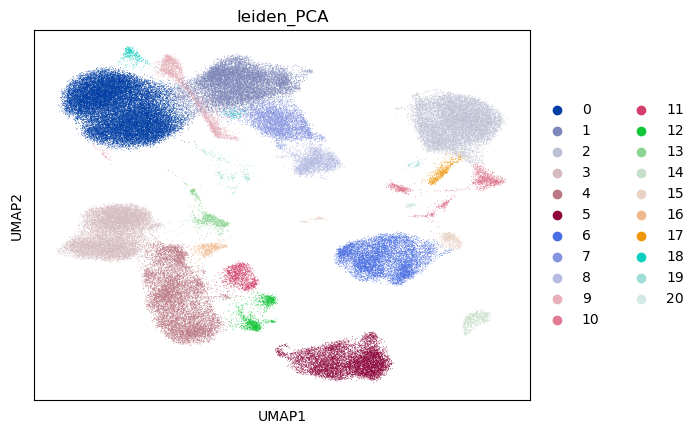

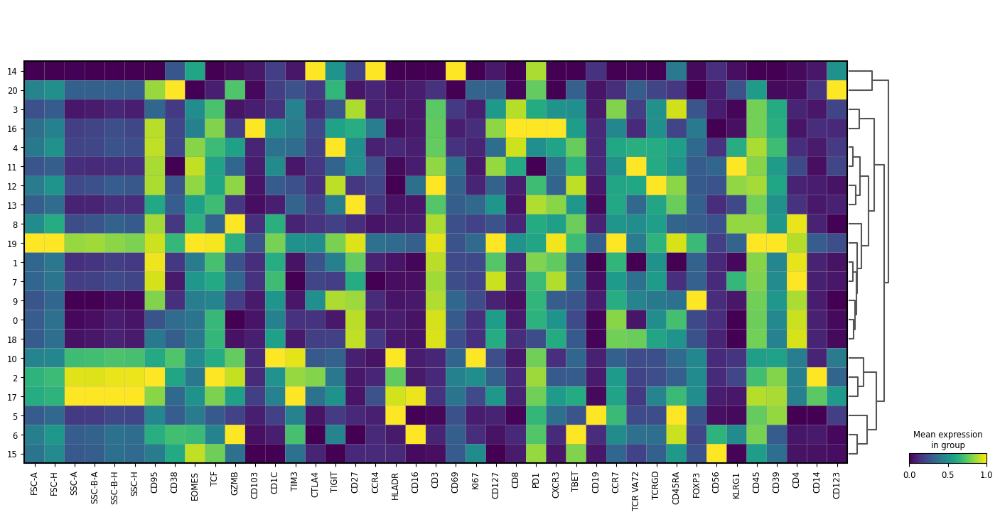

In [24]:
sc.tl.leiden(adata_batch2, key_added="leiden_PCA", resolution = 0.5)
sc.pl.umap(adata_batch2, color = 'leiden_PCA')
sc.pl.matrixplot(adata_batch2, var_names=list(adata_batch2.var_names), dendrogram=True, groupby='leiden_PCA', use_raw = False, layer = 'scaled', standard_scale='var')


No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


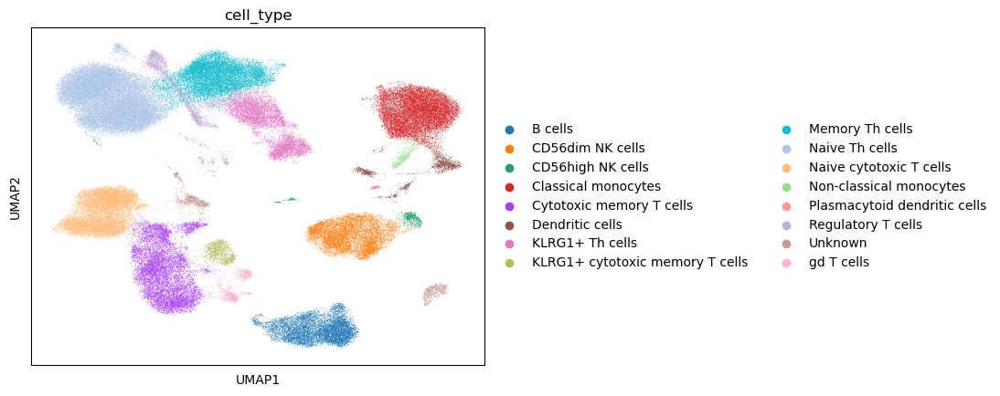

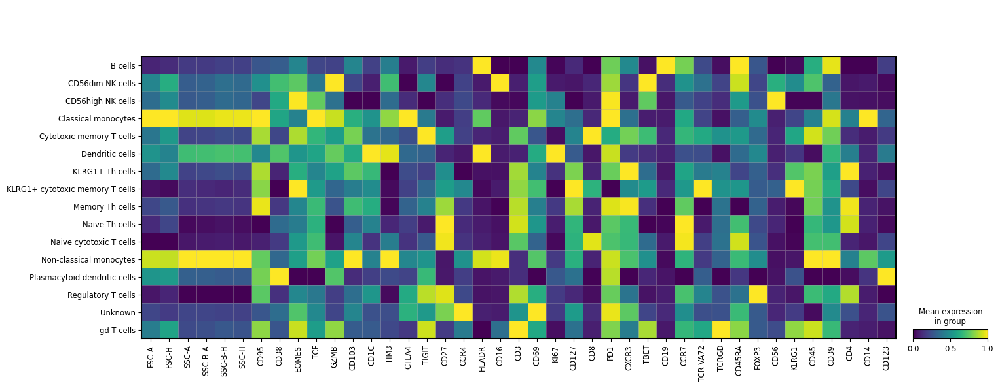

In [26]:
# annotate
ann_dict_2 = {'14': 'Unknown',
            '20': 'Plasmacytoid dendritic cells',
            '3': 'Naive cytotoxic T cells',
            '16': 'Cytotoxic memory T cells',
            '4': 'Cytotoxic memory T cells',
            '11': 'KLRG1+ cytotoxic memory T cells',
            '12': 'gd T cells',
            '13': 'Unknown',
            '8': 'KLRG1+ Th cells',
            '19': 'Unknown',
            '1': 'Memory Th cells',
            '7': 'KLRG1+ Th cells',
            '9': 'Regulatory T cells',
            '0': 'Naive Th cells',
            '18': 'Naive Th cells',
            '10': 'Dendritic cells',
            '2': 'Classical monocytes',
            '17': 'Non-classical monocytes',
            '5': 'B cells',
            '6': 'CD56dim NK cells',
            '15': 'CD56high NK cells'            
            }


adata_batch2.obs['cell_type'] = adata_batch2.obs['leiden_PCA'].map (ann_dict_2).astype('category')

sc.pl.umap(adata_batch2, color = 'cell_type')
sc.pl.matrixplot(adata_batch2, var_names=list(adata_batch2.var_names), groupby='cell_type', use_raw = False, layer = 'scaled', standard_scale='var')        

In [30]:
del adata_batch1.uns['scaler_params']
del adata_batch2.uns['scaler_params']

adata_batch1.write('../data/raw/Spectral flow/Nunez/For Chiquito/annotated/2024-01-24_norm_sample_batch1_ann.h5ad')
adata_batch2.write('../data/raw/Spectral flow/Nunez/For Chiquito/annotated/2024-01-24_norm_sample_batch2_ann.h5ad')